In [1]:
from __future__ import print_function, unicode_literals, absolute_import, division
import sys
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

from glob import glob
from tifffile import imread
from csbdeep.utils import Path, normalize
import cv2
import os

from stardist import random_label_cmap, _draw_polygons
from stardist.models import StarDist2D
from stardist import matching 
import stardist

np.random.seed(6)
lbl_cmap = random_label_cmap()

Using TensorFlow backend.


# Data

We assume that data has already been downloaded in via notebook [1_data.ipynb](1_data.ipynb).  
We now load images from the sub-folder `test` that have not been used during training.

In [2]:
#X0 = sorted(glob('../../../../Videos/160930.nd2_PC3_0Gy_p1/train-Perm160930.nd2_PC3_0Gy_p1/images/*.tif'))
X0 = sorted(glob('D:/Archivos/Trabajo/Nantes/Videos/160930.nd2_PC3_0Gy_p3/test-PermC1-160930.nd2_PC3_0Gy_p3/images/*.tif'))

X0 = list(map(imread,X0))

#~~
#a=np.array(X0)
#a=normalize(a)
#a=a.tolist()
#~~

n_channel0 = 1 if X0[0].ndim == 2 else X0[0].shape[-1]
axis_norm0 = (0,1)   # normalize channels independently
# axis_norm = (0,1,2) # normalize channels jointly
if n_channel0 > 1:
    print("Normalizing image channels %s." % ('jointly' if axis_norm4 is None or 2 in axis_norm4 else 'independently'))

In [3]:
X0Mask = sorted(glob('D:/Archivos/Trabajo/Nantes/Videos/160930.nd2_PC3_0Gy_p3/test-PermC1-160930.nd2_PC3_0Gy_p3/masks/*.tif'))
X0Mask = list(map(imread,X0Mask))

n_channel0 = 1 if X0[0].ndim == 2 else X0[0].shape[-1]
axis_norm0 = (0,1)   # normalize channels independently
# axis_norm = (0,1,2) # normalize channels jointly
if n_channel0 > 1:
    print("Normalizing image channels %s." % ('jointly' if axis_norm0 is None or 2 in axis_norm0 else 'independently'))

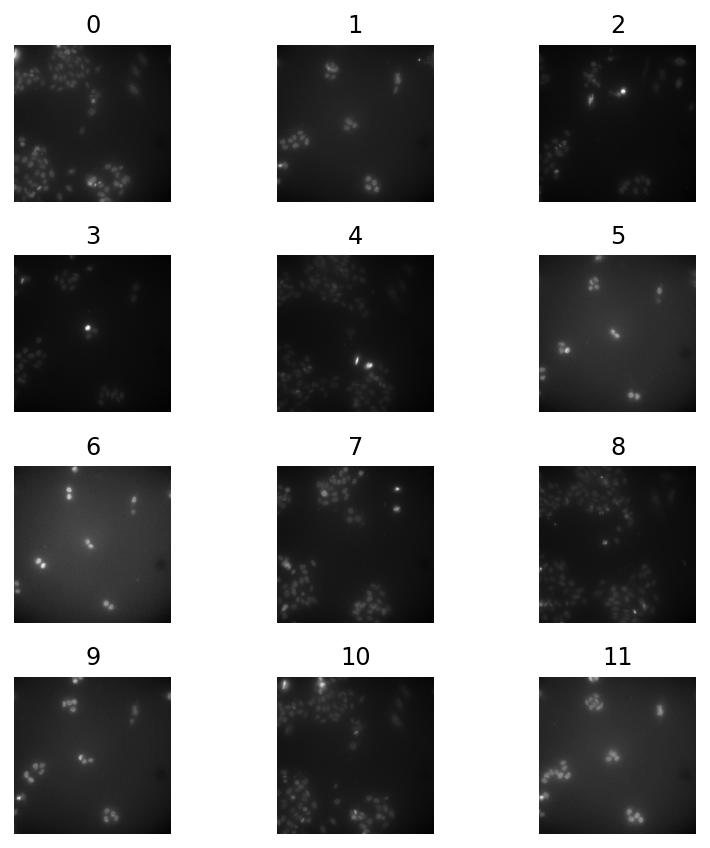

In [4]:
# show all test images
if True:
    fig, ax = plt.subplots(4,3, figsize=(6,6))
    for i,(a,x) in enumerate(zip(ax.flat, X0)):
        #~~
        x=normalize(x, 1,99.8, axis=axis_norm0)
        #~~
        
        a.imshow(x if x.ndim==2 else x[...,0], cmap='gray')
        a.set_title(i)
    [a.axis('off') for a in ax.flat]
    plt.tight_layout()
None;


# Load trained model

If you trained your own StarDist model (and optimized its thresholds) via notebook [2_training.ipynb](2_training.ipynb), then please set `demo_model = False` below.

In [6]:
#Change the model's folder name here
modelFolder='5-NantesWeights24-07-2020(sweeping unet_depth)/NantesWeights24-07-2020(unet_depth=3)-1'


demo_model = False

if demo_model:
    print (
        "NOTE: This is loading a previously trained demo model!\n"
        "      Please set the variable 'demo_model = False' to load your own trained model.",
        file=sys.stderr, flush=True
    )
    model = StarDist2D(None, name='2D_demo', basedir='../../models/examples')
else:
    model = StarDist2D(None, name='stardist', basedir='D:/Archivos/Trabajo/Nantes/Algorithms/colabModels/'+modelFolder)
None;

Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.55181, nms_thresh=0.3.


## Prediction

Make sure to normalize the input image beforehand or supply a `normalizer` to the prediction function.

Calling `model.predict_instances` will
- predict object probabilities and star-convex polygon distances (see `model.predict` if you want those)
- perform non-maximum suppression (with overlap threshold `nms_thresh`) for polygons above object probability threshold `prob_thresh`.
- render all remaining polygon instances in a label image
- return the label instances image and also the details (coordinates, etc.) of all remaining polygons

In [7]:
img = normalize(X0[1], 1,99.8, axis=axis_norm0)
labels, details = model.predict_instances(img)

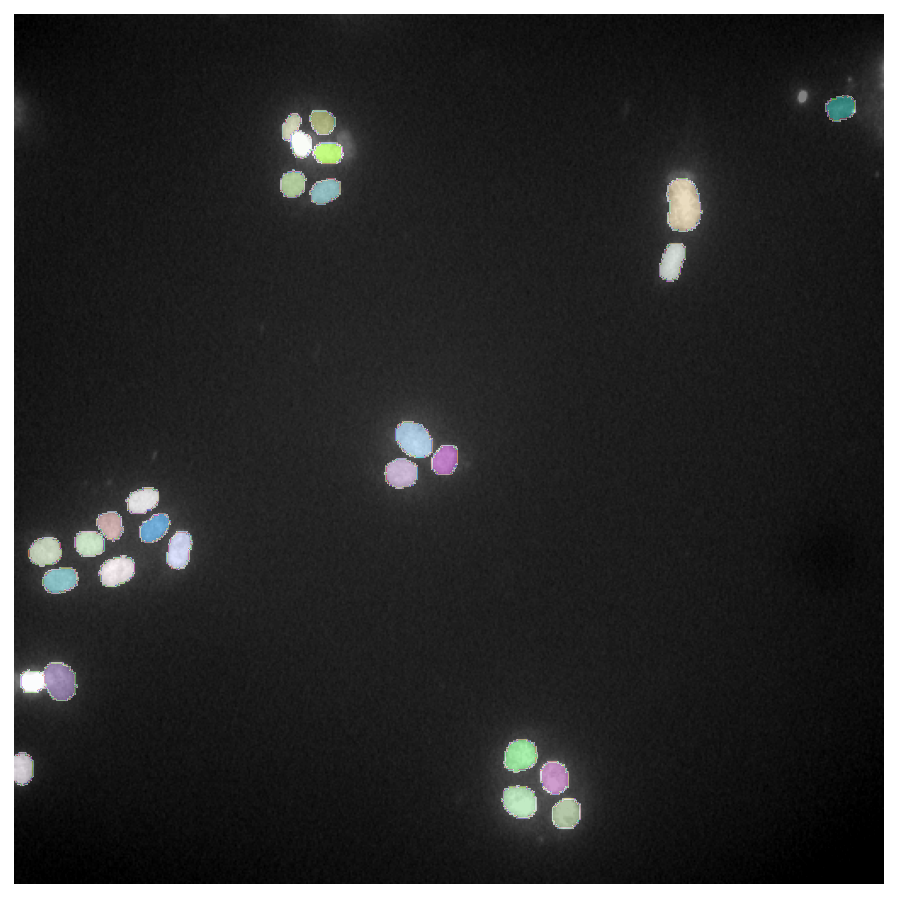

In [8]:
plt.figure(figsize=(8,8))
plt.imshow(img if img.ndim==2 else img[...,0], clim=(0,1), cmap='gray')
plt.imshow(labels, cmap=lbl_cmap, alpha=0.5)
plt.axis('off');

# Example results

In [9]:
def example(model, i, show_dist=True):
    img = normalize(X0[i], 1,99.8, axis=axis_norm0)
    labels, details = model.predict_instances(img)

    plt.figure(figsize=(13,10))
    img_show = img if img.ndim==2 else img[...,0]
    coord, points, prob = details['coord'], details['points'], details['prob']
    plt.subplot(121); plt.imshow(img_show, cmap='gray'); plt.axis('off')
    a = plt.axis()
    _draw_polygons(coord, points, prob, grid=model.config.grid, show_dist=show_dist)
    plt.axis(a)
    plt.subplot(122); plt.imshow(img_show, cmap='gray'); plt.axis('off')
    plt.imshow(labels, cmap=lbl_cmap, alpha=0.5)
    plt.tight_layout()
    plt.show()
    
def exampleCompar(model, i, show_dist=True):
    img = normalize(X0[i], 1,99.8, axis=axis_norm0)
    labels, details = model.predict_instances(img)

    plt.figure(figsize=(13,10))
    img_show = img if img.ndim==2 else img[...,0]
    coord, points, prob = details['coord'], details['points'], details['prob']
    plt.subplot(121); plt.imshow(img_show, cmap='gray'); plt.axis('off')
    plt.imshow(X0Mask[i],cmap=lbl_cmap,alpha=0.5)
    plt.title('Ground Truth')
    
    plt.subplot(122); plt.imshow(img_show, cmap='gray'); plt.axis('off')
    plt.imshow(labels, cmap=lbl_cmap, alpha=0.5)
    plt.tight_layout()
    plt.title('Prediction')
    plt.show()

    
def getMask(model, image, axis_norm, show_dist=True):
    img = normalize(image, 1,99.8, axis=axis_norm)
    
    labels, details = model.predict_instances(img)
    return labels

In [11]:
#Creation of predicted labels
predLabels=list()
predDetails=list()
precisions=list()
recalls=list()
accuracies=list()
f1s=list()
mean_true_scores=list()

for j in range(len(X0)):
    img = normalize(X0[j], 1,99.8, axis=axis_norm0)
    labels, details = model.predict_instances(img)
    predLabels.append(labels)
    predDetails.append(details)
    
    scores=matching.matching_dataset(X0Mask[j],predLabels[j])
    
    precisions.append(scores.precision)
    recalls.append(scores.recall)
    accuracies.append(scores.accuracy)
    f1s.append(scores.f1)
    mean_true_scores.append(scores.mean_true_score)

    
print('precision (mean=',np.mean(precisions),'+-',np.std(precisions),'):\n',precisions,'\n')
print('recall (mean=',np.mean(recalls),'+-',np.std(recalls),'):\n',recalls,'\n')
print('accuracy (mean=',np.mean(accuracies),'+-',np.std(accuracies),'):\n',accuracies,'\n\n')
print('f1(mean=',np.mean(f1s),'+-',np.std(f1s),'):\n',f1s,'\n\n')
print('mean_true_score(mean=',np.mean(mean_true_scores),'+-',np.std(mean_true_scores),'):\n',mean_true_scores,'\n\n')    

100%|██████████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 1337.58it/s]

precision (mean= 0.8140875744298648 +- 0.03815211529123662 ):
 [0.8510875627440044, 0.871578947368421, 0.7314715359828142, 0.768595041322314, 0.8284142071035517, 0.8397212543554007, 0.8391304347826087, 0.824750192159877, 0.7679245283018868, 0.8255813953488372, 0.8118527042577676, 0.8089430894308943] 

recall (mean= 0.7808054049965296 +- 0.070291218448924 ):
 [0.8558609085810431, 0.8607068607068608, 0.6920731707317073, 0.7117346938775511, 0.7774647887323943, 0.7046783625730995, 0.9234449760765551, 0.7669764117226591, 0.7471317117944011, 0.8333333333333334, 0.7817174515235457, 0.7145421903052065] 

accuracy (mean= 0.6643600405517959 +- 0.07024981895456028 ):
 [0.744390243902439, 0.7638376383763837, 0.5518638573743923, 0.5861344537815126, 0.6696320258794985, 0.6211340206185567, 0.7845528455284553, 0.6594960049170252, 0.6095095469861476, 0.7085828343313373, 0.6618198874296435, 0.6113671274961597] 


f1(mean= 0.7962109969314969 +- 0.05040816960921648 ):
 [0.8534675615212528, 0.8661087866108

Jaccard coefficient:  0.7383153894870171


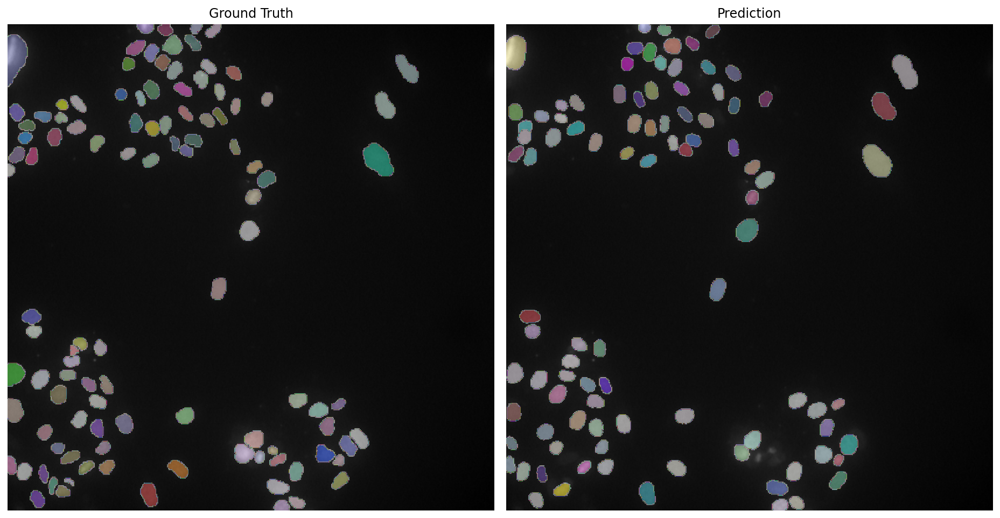

Jaccard coefficient:  0.7507277462846637


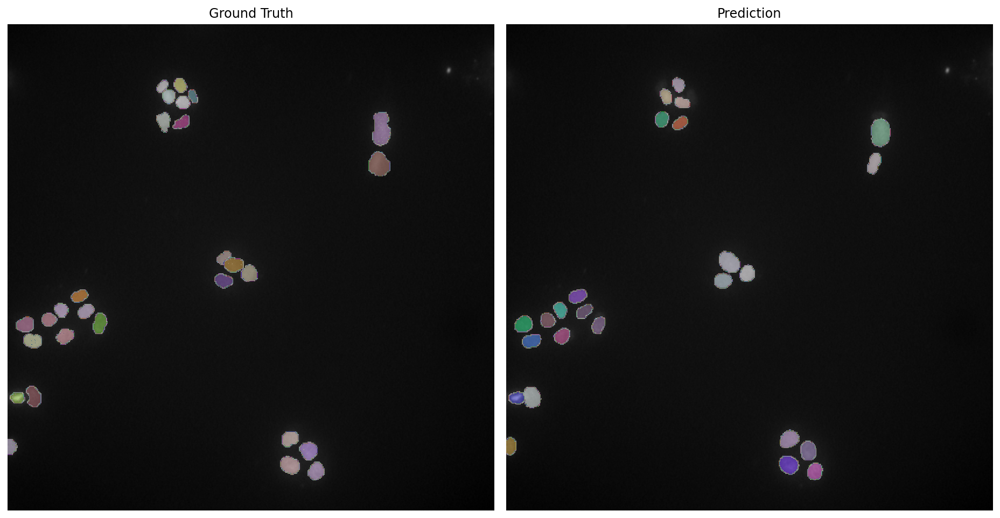

Jaccard coefficient:  0.6314809510169006


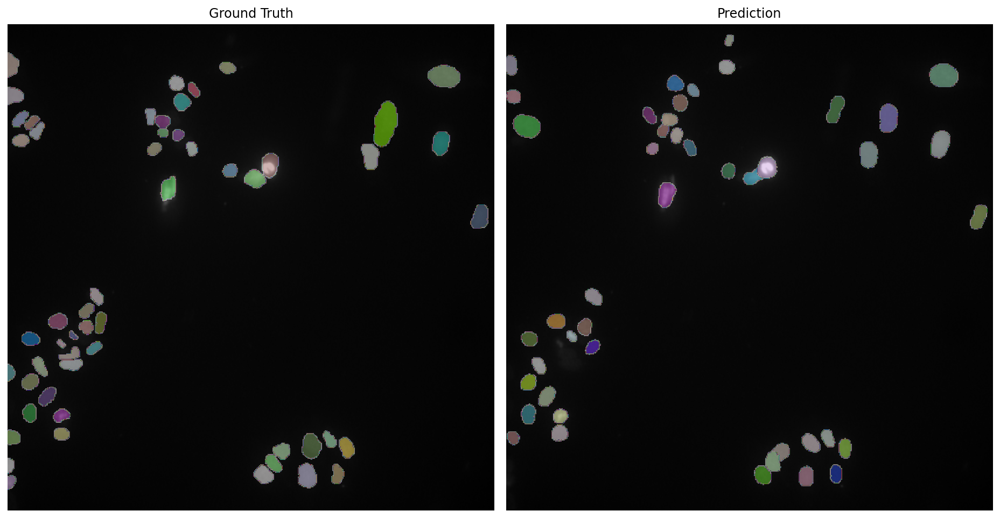

Jaccard coefficient:  0.6200109349371241


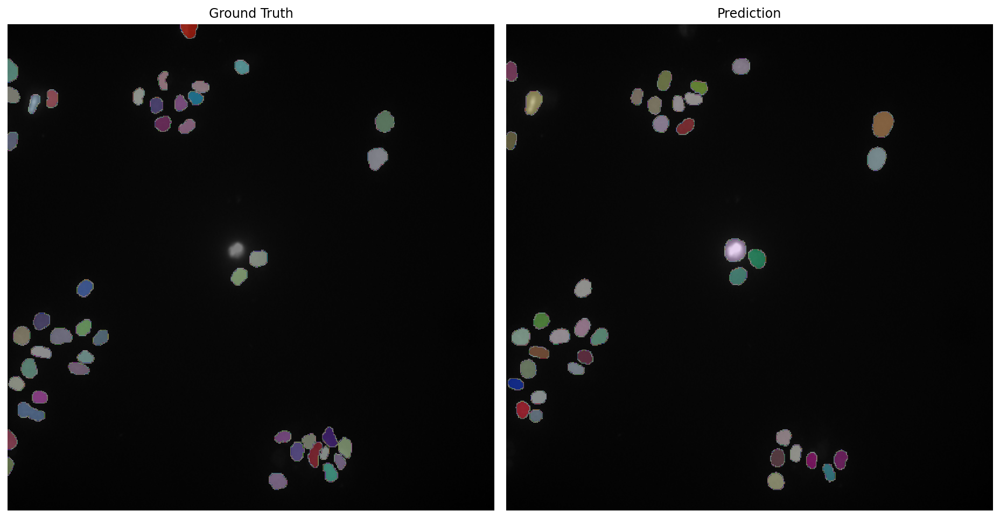

Jaccard coefficient:  0.594071592191186


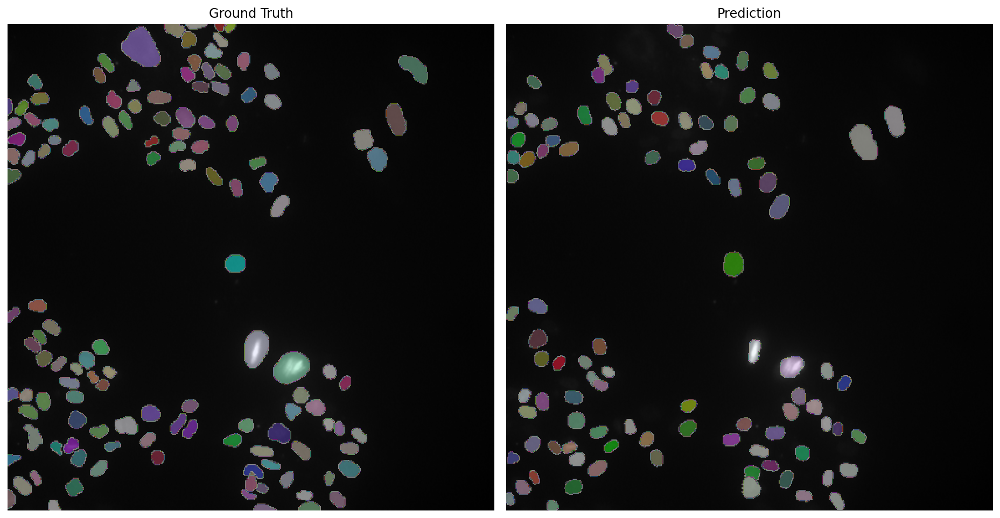

Jaccard coefficient:  0.584449330401759


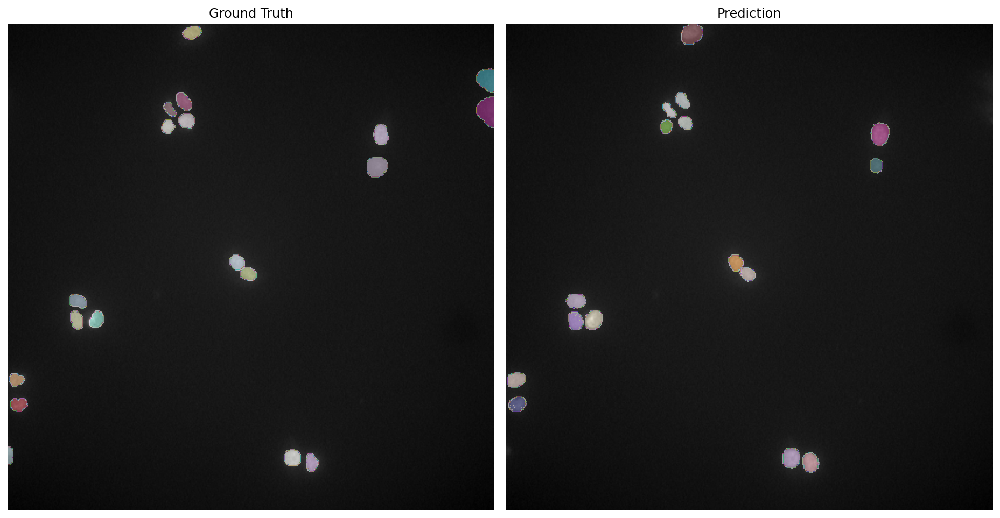

Jaccard coefficient:  0.7647622087456112


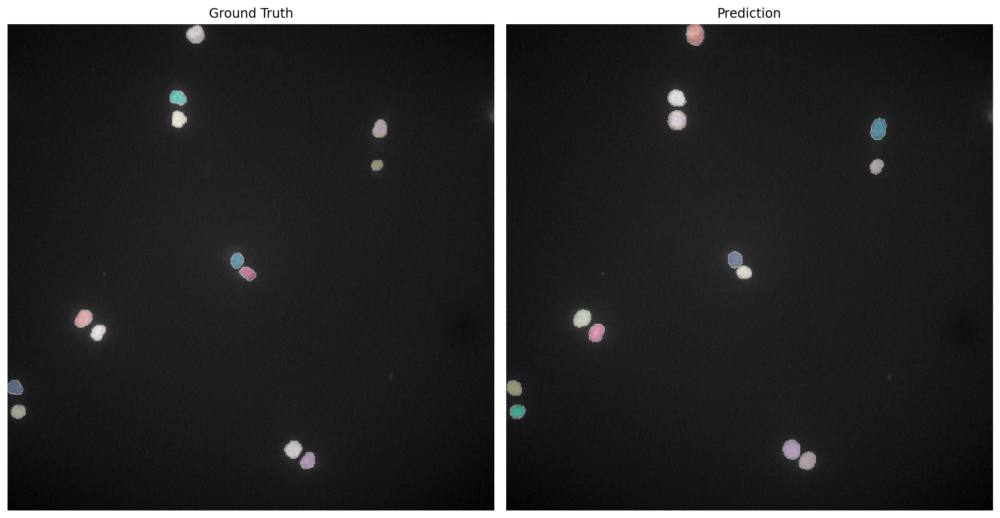

Jaccard coefficient:  0.6835916622127205


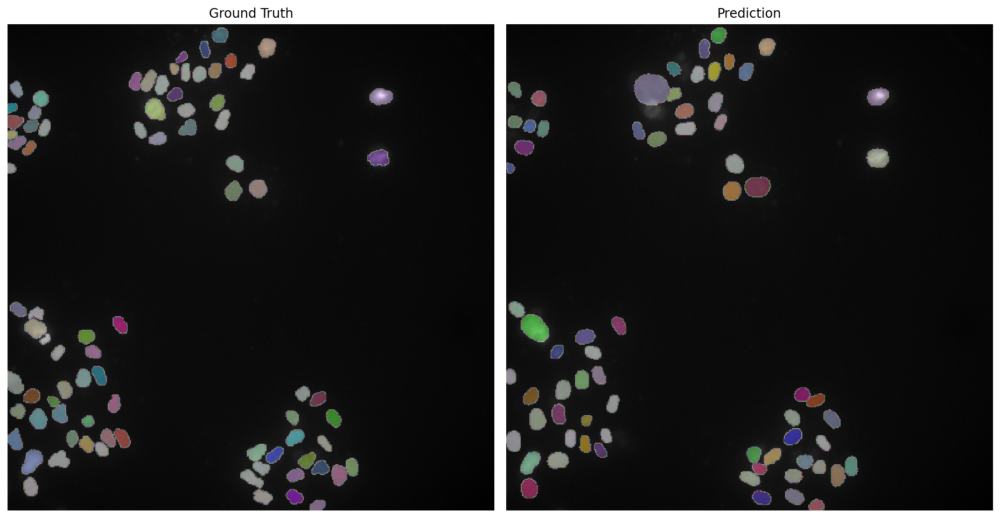

Jaccard coefficient:  0.6073725543294293


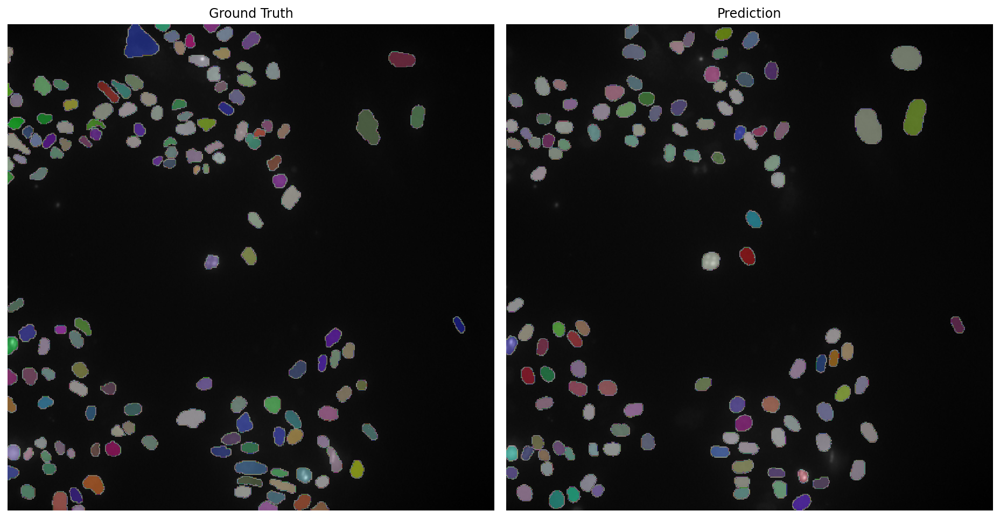

Jaccard coefficient:  0.7503889369057909


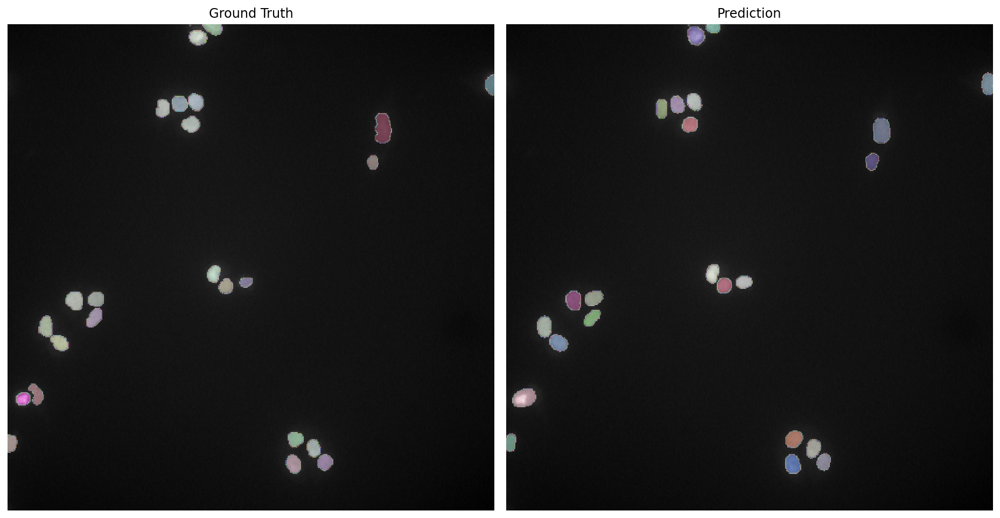

Jaccard coefficient:  0.630092745942365


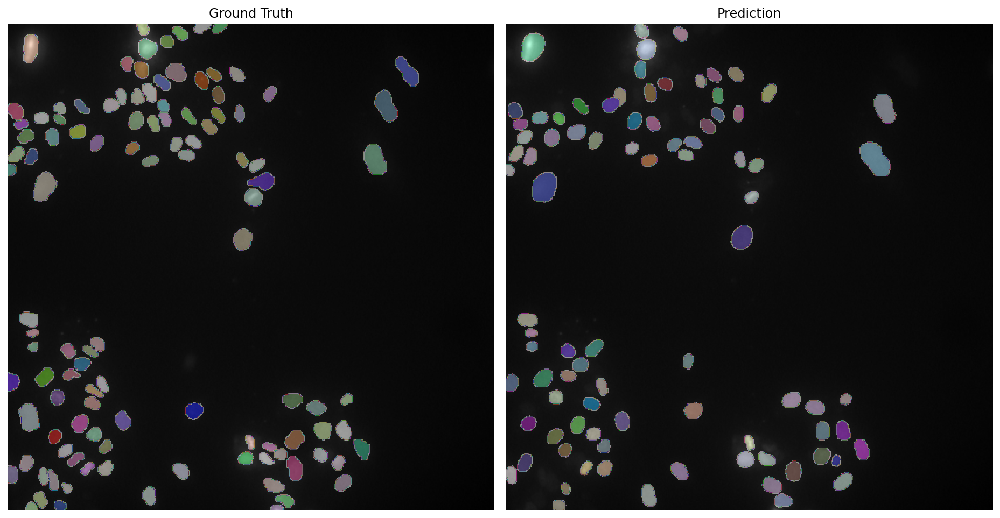

Jaccard coefficient:  0.6420599704181794


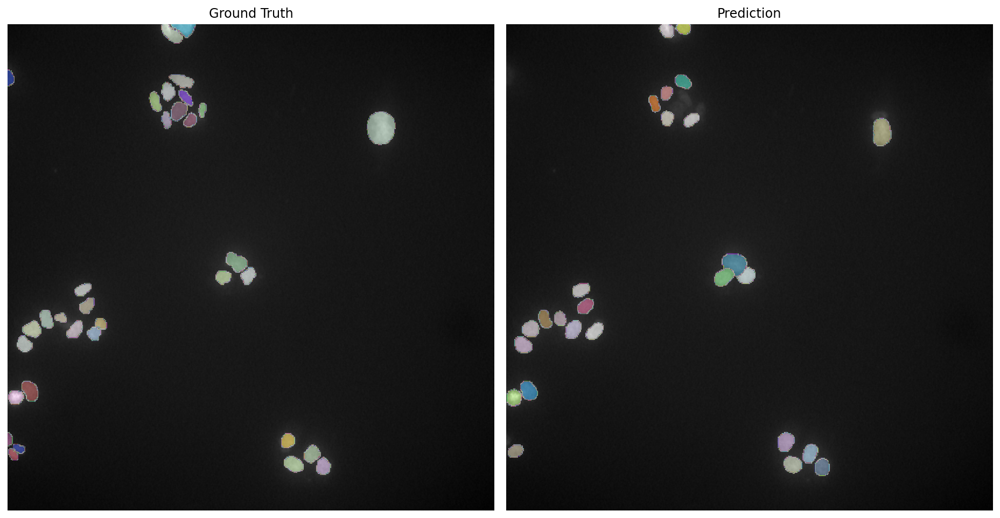

acc:  [0.9096488952636719, 0.9751014709472656, 0.9467315673828125, 0.9581375122070312, 0.8884239196777344, 0.9809150695800781, 0.9880485534667969, 0.9286270141601562, 0.8873062133789062, 0.9779319763183594, 0.907867431640625, 0.9716300964355469]
jacc:  [0.7383153894870171, 0.7507277462846637, 0.6314809510169006, 0.6200109349371241, 0.594071592191186, 0.584449330401759, 0.7647622087456112, 0.6835916622127205, 0.6073725543294293, 0.7503889369057909, 0.630092745942365, 0.6420599704181794]


In [14]:
#Check accuracy

from sklearn.metrics import jaccard_score

acc=list()
jacc=list()

for i in range(len(X0)):
    labels = getMask(model,X0[i],(0,1))
    labels=labels/255
    vectLabel=labels.ravel()
    yVal=X0Mask[i].ravel()
    
    #print(type(vectLabel))
    #print(type(yVal))
    
    jacc.append(jaccard_score(vectLabel>0,yVal>0))
    acc.append(len([yVal for j in range(0, len(yVal)) if yVal[j] == vectLabel[j]]) / len(yVal))
    print('Jaccard coefficient: ',jacc[-1])
    
    exampleCompar(model,i)
    
    
print('acc: ',acc)
print('jacc: ',jacc)

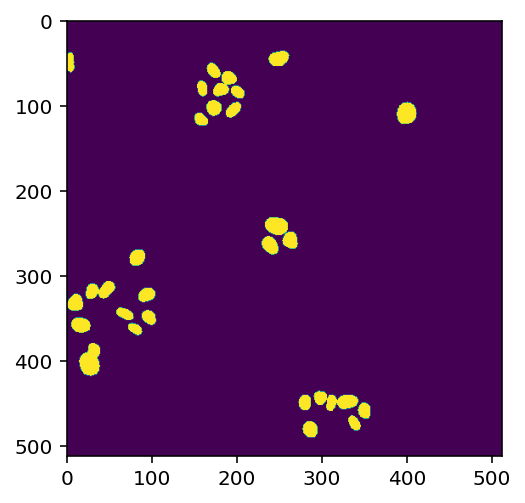

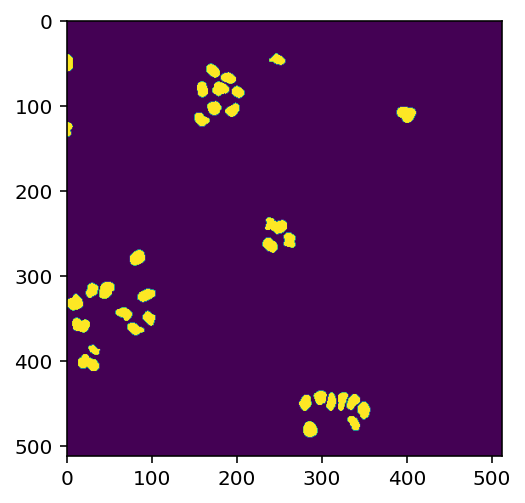

In [47]:
for example(model, 1)

In [39]:
yVal.astype(int)

array([0, 0, 0, ..., 0, 0, 0])

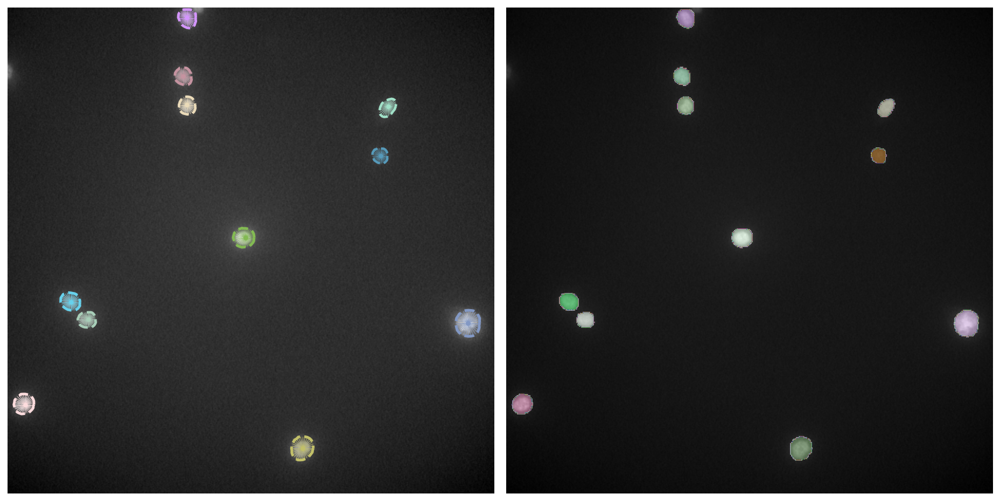

In [12]:
example(model, 1)

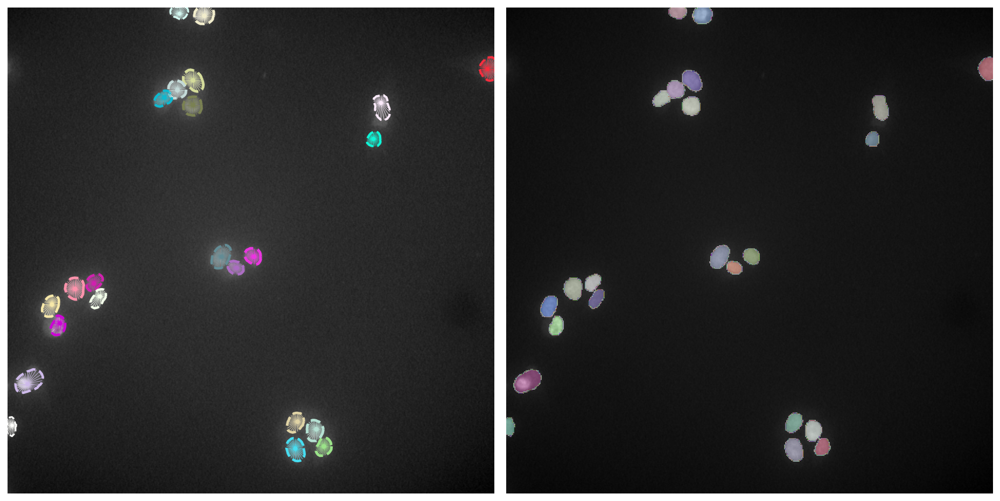

In [13]:
example(model, 4)

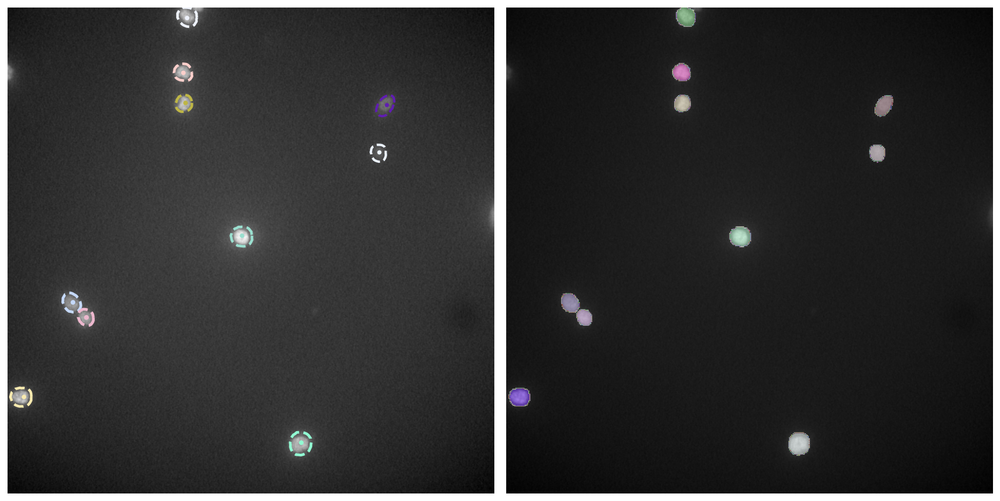

In [14]:
example(model, 2, False)

In [18]:
#Save masks
from tifffile import imsave

os.chdir('D:/Archivos/Trabajo/Nantes/Videos/160930.nd2_PC3_0Gy_p3/segmentationResults/TrackingIlastik/CTC_Format/Evaluation_software/RealDataSeg/01_RES')
for i in range(len(predLabels)):
    mask=getMask(model, X0[i],axis_norm0)
    numzeros=3-len(str(i))
    zers=''
    for j in range(numzeros):
        zers=zers+'0'
       

    name='mask'+zers+str(i)+'.tif'
    imsave(name,mask)
    